# GAN Explorations

-- Steven Larsen, Nick Larsen

In [81]:
import numpy as np
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data

import torch.nn.functional as F

import torchvision
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import torch.autograd as autograd
from torch.autograd import Variable

import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from torchvision.utils import save_image

#import torchgan

# Seed control, for better reproducibility 
# NOTE: this does not gurantee results are always the same
seed = 22
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)


if torch.cuda.is_available():
    device = torch.device("cuda:0")
    # work on a single GPU or CPU
    cudnn.benchmark=True
    #generator.cuda()
    #discriminator.cuda()
    #adversarial_loss.cuda()
    Tensor = torch.cuda.FloatTensor
    print(device)
else:
    device = torch.device("cpu")
    cudnn.benchmark=False
    Tensor = torch.FloatTensor


cuda:0


In [82]:
def norm_grid(im):
    # first half should be normalized and second half also, separately
    im = im.astype(np.float)
    rows,cols,chan = im.shape
    cols_over2 = int(cols/2)
    tmp = im[:,:cols_over2,:]
    im[:,:cols_over2,:] = (tmp-tmp.min())/(tmp.max()-tmp.min())
    tmp = im[:,cols_over2:,:]
    im[:,cols_over2:,:] = (tmp-tmp.min())/(tmp.max()-tmp.min())
    return im

In [83]:
from PIL import Image
from matplotlib import image
from matplotlib import pyplot

In [84]:
from matplotlib import image
from matplotlib import pyplot

We are going to save off the images in the 64x64 format so we don't have to do that in the future

In [85]:
dataroot = "./data/celeba_smaller/"
if True:
    workers = 32

    batch_size = 128

    image_size = 64

    nc = 3

    nz = 100

    dataset = dset.ImageFolder(root=dataroot,
                               transform=transforms.Compose([
                                   transforms.Resize(image_size),
                                   transforms.CenterCrop(image_size),
                                   transforms.ToTensor(),
                                   transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),]))

#    img_num = 1
#    path="data/celeba_small/img_align_celeba/"
#
#    for i, (imgs, classes) in enumerate(dataloader):
#        for img in imgs:
#            save_image(img,  f"{path}{img_num:06}.jpg")
#            img_num += 1
#            if img_num % 100 == 0: print(f"save {img_num} images")
#
#        if img_num > 100000:
#            breakns
#

In [86]:
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=1)

In [87]:
%%time
dataiter = iter(dataloader)
real_image_examples, classes = dataiter.next()

CPU times: user 7.28 ms, sys: 64.4 ms, total: 71.7 ms
Wall time: 216 ms


In [88]:
real_image_examples.shape

torch.Size([128, 3, 64, 64])

In [89]:
def imshow(img):
    # custom show in order to display
    # torch tensors as numpy
    npimg = img.numpy() / 2 + 0.5 # from tensor to numpy
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.axis('off')
    plt.show()


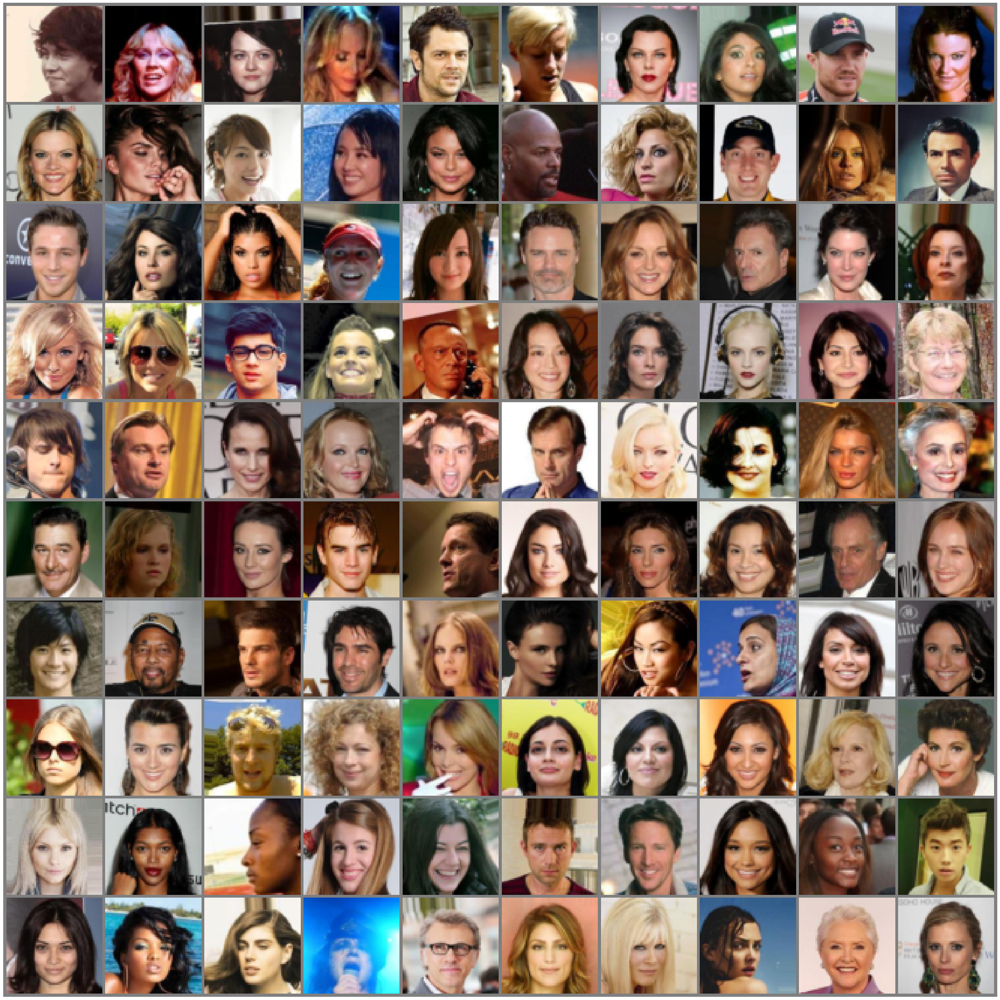

In [90]:
plt.figure(figsize=(40,40))
imshow(torchvision.utils.make_grid(real_image_examples[0:100], padding=2, normalize=False, nrow=10).cpu())

In [91]:
len(dataloader)

198

In [92]:
latent_dim = 100
EPOCHS = 501
height = real_image_examples[0].shape[1]
width = real_image_examples[0].shape[2]
channels = real_image_examples[0].shape[0]


In [93]:
class Generator(nn.Module):
    def __init__(self, latent_dim):
        super(Generator, self).__init__()
        
        # First, transform the input into a 8x8 256-channels feature map
        self.init_size = width // 16  # one 16th the image size 
        self._latent_dim = latent_dim
        self.l1 = nn.Sequential(
            nn.Linear(self._latent_dim, 64), nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(64, 128), nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(128, 256 * self.init_size ** 2), nn.LeakyReLU(0.2, inplace=True), # 4X4
        )
        
        self.conv_blocks = nn.Sequential(
            #input 256 X init_size X init_size
            
            ############# 4x4 #########################################
            
            nn.BatchNorm2d(256), 
            nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1), #8X8
            nn.LeakyReLU(0.2, inplace=True),
            
            ############# 8X8 #########################################
            
            nn.BatchNorm2d(128), 
            nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1), #16X16
            nn.LeakyReLU(0.2, inplace=True),
            
            ############# 16X16 #########################################
            
            nn.BatchNorm2d(64), 
            nn.ConvTranspose2d(64, 32, 4, stride=2, padding=1), #32X32
            nn.LeakyReLU(0.2, inplace=True),
            
            ############# 32X32 #########################################
            
            nn.BatchNorm2d(32), 
            nn.ConvTranspose2d(32, 16, 4, stride=2, padding=1), #64X64
            nn.LeakyReLU(0.2, inplace=True),
            
            ############# 64X64 #########################################
            
            # Produce a 32x32xRGB-channel feature map
            nn.Conv2d(16, channels, kernel_size=3, padding='same'),
            nn.Tanh(),
        )
        
    def forward(self, z):
        
        # expand the sampled z to 8x8
        out = self.l1(z)
        
        out = torch.reshape(out, (out.shape[0], 256, self.init_size, self.init_size))
        
        # use the view function to reshape the layer output
        #  old way for earlier Torch versions: out = out.view(out.shape[0], 128, self.init_size, self.init_size)
        img = self.conv_blocks(out)
        return img

In [94]:
%time
gen = Generator(latent_dim).to(device)

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 3.58 µs


In [95]:
random_latent_vectors = Variable(Tensor(np.random.normal(0, 1, (32, latent_dim))))
generated_images = gen(random_latent_vectors)

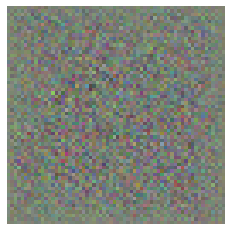

In [96]:
imshow(generated_images[1].detach().cpu())

In [97]:
class Discriminator(nn.Module):

    def __init__(self, latent_dim):
        super(Discriminator, self).__init__()
        
        self.init_size = width // 16 # one 16th the image size 
        self._latent_dim = latent_dim

        self.model = nn.Sequential(
            
            ############# 64X64 #########################################
            nn.Conv2d(in_channels=3, out_channels=16, kernel_size=3, stride=1, padding='same'), #64X64
            nn.LeakyReLU(0.2, inplace=True),
            nn.BatchNorm2d(16, 0.8),
            
            nn.Conv2d(in_channels=16, out_channels=32, kernel_size=4, stride=2, padding=1), #32X32
            nn.LeakyReLU(0.2, inplace=True),
            nn.BatchNorm2d(32, 0.8),
            
            ############# 32X32 #########################################
            
            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=4, stride=2, padding=1), #16X16
            nn.LeakyReLU(0.2, inplace=True),
            nn.BatchNorm2d(64, 0.8),
            
            ############# 16X16 #########################################
            
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=4, stride=2, padding=1), #8x8
            nn.LeakyReLU(0.2, inplace=True),
            nn.BatchNorm2d(128, 0.8),
            
            ############# 8X8 #########################################
            
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=4, stride=2, padding=1), #4X4
            nn.LeakyReLU(0.2, inplace=True),
            nn.BatchNorm2d(256, 0.8),
            
            ############# 4x4 #########################################
            
            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.BatchNorm2d(256, 0.8),
        )
        
        # laten_dim_layer layer
        self.laten_dim_layer = nn.Sequential(nn.Linear(256 * self.init_size ** 2, 128), nn.LeakyReLU(0.2, inplace=True),
                                             nn.Linear(128, 64), nn.LeakyReLU(0.2, inplace=True),
                                             nn.Linear(64, self._latent_dim), nn.LeakyReLU(0.2, inplace=True),
                                            )
        # Classification layer
        self.classification_layer = nn.Sequential(nn.Linear(self._latent_dim, 1), 
                                                  nn.Sigmoid())
    def forward(self, img):
        
        out = self.model(img)
        # use the view function to flatten the layer output
        #    old way for earlier Torch versions: out = out.view(out.shape[0], -1)
        out = torch.flatten(out, start_dim=1) # don't flatten over batch size
        
        # move to the latent dim
        out = self.laten_dim_layer(out)
        
        #validate the latent dim
        validity = self.classification_layer(out)
        return validity


In [98]:
disc = Discriminator(latent_dim).to(device)

In [99]:
disc(generated_images)

tensor([[0.4698],
        [0.4698],
        [0.4698],
        [0.4698],
        [0.4698],
        [0.4698],
        [0.4698],
        [0.4698],
        [0.4698],
        [0.4698],
        [0.4698],
        [0.4698],
        [0.4698],
        [0.4698],
        [0.4698],
        [0.4698],
        [0.4698],
        [0.4698],
        [0.4698],
        [0.4698],
        [0.4698],
        [0.4698],
        [0.4698],
        [0.4698],
        [0.4698],
        [0.4698],
        [0.4698],
        [0.4698],
        [0.4698],
        [0.4698],
        [0.4698],
        [0.4698]], device='cuda:0', grad_fn=<SigmoidBackward0>)

In [100]:
# custom weights initialization called on netG and netD
# this function from PyTorch's officail DCGAN example:
# https://github.com/pytorch/examples/blob/master/dcgan/main.py#L112
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02) # filters are zero mean, small STDev
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02) # batch norm is unit mean, small STDev
        m.bias.data.fill_(0) # like normal, biases start at zero

In [101]:
batch_size

128

### Define an Inception score using our classifier mde in Classify faces

In [102]:
class Classifier(nn.Module):
    def __init__(self, n_classes):
        super(Classifier, self).__init__()
        self.conv_blocks = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, stride=1, padding='same'),
            nn.ReLU(),
            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, stride=1, padding='same'),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=(2,2), stride=2),
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding='same'),
            nn.ReLU(),
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=1, padding='same'),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=(2,2), stride=2),
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, stride=1, padding='same'),
            nn.MaxPool2d(kernel_size=(2,2), stride=2),
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, stride=1, padding='same'),
        )
        self.fully_connected = nn.Sequential(
            nn.Linear(128*8*8, 128*8), nn.ReLU(),
            nn.Linear(128*8, 128), nn.ReLU(),
            nn.Linear(128, 64), nn.ReLU(),
            nn.Linear(64, n_classes),
        )
        
        self.classify =  nn.Softmax(dim=1)
        
        
    def forward(self, img):
        out = self.conv_blocks(img)
        out = torch.flatten(out, start_dim=1)
        out = self.fully_connected(out)
        out = self.classify(out)
        return out

checkpoint = torch.load( 'models/gan_models/face_classifier.pth')
model1 = Classifier(8).to(device)
model1.load_state_dict(checkpoint['state_dict'])

<All keys matched successfully>

In [103]:
import torch
from torch import nn
from torch.autograd import Variable
from torch.nn import functional as F
import torch.utils.data

from torchvision.models.inception import inception_v3

import numpy as np
from scipy.stats import entropy

def inception_score(imgs, cuda=True, batch_size=32, resize=False, splits=1):
    """Computes the inception score of the generated images imgs
    imgs -- Torch dataset of (3xHxW) numpy images normalized in the range [-1, 1]
    cuda -- whether or not to run on GPU
    batch_size -- batch size for feeding into Inception v3
    splits -- number of splits
    """
    N = len(imgs)

    assert batch_size > 0
    assert N > batch_size

    # Set up dtype
    if cuda:
        dtype = torch.cuda.FloatTensor
    else:
        if torch.cuda.is_available():
            print("WARNING: You have a CUDA device, so you should probably set cuda=True")
            print("but I don't want to take up memory on my GPU....")
        dtype = torch.FloatTensor

    # Set up dataloader
    dataloader = torch.utils.data.DataLoader(imgs, batch_size=batch_size)

    def get_pred(x):
        if resize:
            x = up(x)
        x = model1(x)
        return x.data.cpu().numpy()

    # Get predictions
    preds = np.zeros((N, 8))

    for i, batch in enumerate(dataloader, 0):
        batch = batch.type(dtype)
        batchv = Variable(batch)
        batch_size_i = batch.size()[0]

        preds[i*batch_size:i*batch_size + batch_size_i] = get_pred(batchv)

    # Now compute the mean kl-div
    split_scores = []

    for k in range(splits):
        part = preds[k * (N // splits): (k+1) * (N // splits), :]
        py = np.mean(part, axis=0)
        scores = []
        for i in range(part.shape[0]):
            pyx = part[i, :]
            scores.append(entropy(pyx, py))
        split_scores.append(np.exp(np.mean(scores)))

    return np.mean(split_scores), np.std(split_scores)

In [104]:
real_image_examples.shape

torch.Size([128, 3, 64, 64])

### Test IS

In [105]:
inception_score(real_image_examples.to(device))

(6.429683284797381, 0.0)

### Train LS GAN

In [106]:
log_every = 5
save_off_every = 10


# code is the exact same as above, no need to change it
# because we have changed the adversarial loss function
# Start training loop

# Becasue not much is changing, an interesting update would
# be to write a "train step" function and use it here.
# Something like: train_step(g, d, imgs, loss_select=MSE, num_d_steps=1)

def train(generator, gan_optimizer,
          discriminator, discriminator_optimizer,
          iterations, dataloader, begin_step=None
          
    ):
    total_steps = 0
    if begin_step is not None:
        total_steps = begin_step

    for step in range(iterations):
        total_steps = total_steps+1

        for i, (imgs, classes) in enumerate(dataloader):
            #===================================
            # GENERATOR OPTIMIZE AND GET LABELS

            # Zero out any previous calculated gradients
            gan_optimizer.zero_grad()

            # Sample random points in the latent space
            random_latent_vectors = Variable(Tensor(np.random.normal(0, 1, (imgs.shape[0], latent_dim))))
            # Decode them to fake images, through the generator
            generated_images = generator(random_latent_vectors)

            # Assemble labels that say "all real images"
            # misleading target, c=1
            misleading_targets = Variable(Tensor(imgs.shape[0], 1).fill_(1.0), requires_grad=False)

            # Get MSE Loss function
            # want generator output to generate images that are "close" to all "ones" 
            g_loss = adversarial_loss(discriminator(generated_images), misleading_targets)

            # now back propagate to get derivatives
            g_loss.backward()

            # use gan optimizer to only update the parameters of the generator
            # this was setup above to only use the params of generator
            gan_optimizer.step()

            #===================================
            # DISCRIMINATOR OPTIMIZE AND GET LABELS

            # Zero out any previous calculated gradients
            discriminator_optimizer.zero_grad()

            # Combine real images with some generator images
            real_images = Variable(imgs.type(Tensor))
            combined_images = torch.cat([real_images, generated_images.detach()])
            # in the above line, we "detach" the generated images from the generator
            # this is to ensure that no needless gradients are calculated 
            # those parameters wouldn't be updated (becasue we already defined the optimized parameters)
            # but they would be calculated here, which wastes time.

            # Assemble labels discriminating real from fake images
            # real label, a=1 and fake label, b=0
            labels = torch.cat((
                Variable(Tensor(imgs.shape[0], 1).fill_(1.0), requires_grad=False),
                Variable(Tensor(imgs.shape[0], 1).fill_(0.0), requires_grad=False)
            ))
            # Add random noise to the labels - important trick!
            labels += 0.05 * torch.rand(labels.shape).to(device)

            # Setup Discriminator loss
            # this takes the average of MSE(real images labeled as real) + MSE(fake images labeled as fake)
            mid_point = combined_images.shape[0] // 2
            d_loss = (
                adversarial_loss(discriminator(combined_images[:mid_point]), labels[:mid_point]) + \
                adversarial_loss(discriminator(combined_images[mid_point:]), labels[mid_point:])
                ) / 2

            # get gradients according to loss above
            d_loss.backward()
            # optimize the discriminator parameters to better classify images
            discriminator_optimizer.step()

            # Now Clip weights of discriminator (manually)
            for p in discriminator.parameters():
                p.data.clamp_(-clip_value, clip_value)

            #===================================
        
        # Occasionally save / plot
        if step % log_every == 0:
            # Print metrics
            print('Loss at step %s: D(z_c)=%s, D(G(z_mis))=%s' % (total_steps, d_loss.item(),g_loss.item()))
            # save images in a list for display later
        
        if step % save_off_every == 0:
            
            with torch.no_grad():
                fake_output = generator(fixed_random_latent_vectors).detach().cpu()
            img_list.append(torchvision.utils.make_grid(fake_output[0:25], padding=2, normalize=True, nrow=5))
            
            IS_scores.append(inception_score(fake_output.to(device))[0])
            np.save('models/gan_models/ls_is_scores_celeb.npy', IS_scores)

            # in addition, save off a checkpoint of the current models and images
            ims = np.array([np.transpose(np.hstack((i,real_image_numpy)), (2,1,0)) for i in img_list])
            np.save('models/gan_models/ls_images_celeb.npy',ims)

            # save the state of the models (will need to recreate upon reloading)
            torch.save({'state_dict': generator.state_dict()}, 'models/gan_models/ls_gen_celeb.pth')
            torch.save({'state_dict': discriminator.state_dict()}, 'models/gan_models/ls_dis_celeb.pth')
    return (ims)

In [107]:
generator = Generator(latent_dim).to(device)
discriminator = Discriminator(latent_dim).to(device)

# LSGAN says they use ADAM, but follow up papers say RMSProp is lsightly better
#lr = 0.0002
#betas = (0.5, 0.999)

# To stabilize training, we use learning rate decay
# and gradient clipping (by value) in the optimizer.
clip_value = 1.0 # This value will use in the future training process since 
                 # PyTorch didn't has the feature to set clipvalue for 
                 # RMSprop optimizer.
        
# set discriminator learning higher than generator
discriminator_optimizer = torch.optim.RMSprop(discriminator.parameters(),
                                              lr=0.0002, weight_decay=1e-8)

gan_optimizer = torch.optim.RMSprop(generator.parameters(),
                                    lr=0.0001, weight_decay=1e-8)

# used to be: adversarial_loss = torch.nn.BCELoss() # binary cross entropy 
adversarial_loss = torch.nn.MSELoss() # mean squared error loss 

generator.apply(weights_init)
discriminator.apply(weights_init)

Discriminator(
  (model): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): BatchNorm2d(16, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (3): Conv2d(16, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): BatchNorm2d(32, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (6): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): BatchNorm2d(64, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (9): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): BatchNorm2d(128, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (12): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (13): LeakyReLU(neg

In [108]:
%%time
"""
Train the Vanilla GAN. Here we use the train method above and plot each class seperately
"""
iterations = EPOCHS

log_every = 50

# Sample random points in the latent space
plot_num_examples = 200
fixed_random_latent_vectors = torch.randn(plot_num_examples, latent_dim, device=device)
img_list = []
IS_scores = []
total_steps = 0

real_image_numpy = np.transpose(
    torchvision.utils.make_grid(real_image_examples[:25,:,:,:],
                                padding=2, normalize=False, nrow=5),(0,1,2))

ims = train(generator=generator, gan_optimizer=gan_optimizer,
                         discriminator=discriminator, discriminator_optimizer=discriminator_optimizer,
                         iterations=iterations, dataloader=dataloader
                         )

Loss at step 1: D(z_c)=0.1926809847354889, D(G(z_mis))=0.4028654992580414
Loss at step 51: D(z_c)=0.021498937159776688, D(G(z_mis))=0.8408458828926086
Loss at step 101: D(z_c)=0.0056512015871703625, D(G(z_mis))=0.8905208110809326
Loss at step 151: D(z_c)=0.0014944914728403091, D(G(z_mis))=0.9480816721916199
Loss at step 201: D(z_c)=0.0007977962959557772, D(G(z_mis))=0.9790986776351929
Loss at step 251: D(z_c)=0.0007184760761447251, D(G(z_mis))=0.9913501143455505
Loss at step 301: D(z_c)=0.0021929852664470673, D(G(z_mis))=0.932248055934906
Loss at step 351: D(z_c)=0.00125402701087296, D(G(z_mis))=0.9436365365982056
Loss at step 401: D(z_c)=0.0006423058803193271, D(G(z_mis))=0.963659942150116
Loss at step 451: D(z_c)=0.0016719292616471648, D(G(z_mis))=0.9096950888633728
Loss at step 501: D(z_c)=0.010823618620634079, D(G(z_mis))=0.9644041657447815
CPU times: user 1h 9min 11s, sys: 3min 34s, total: 1h 12min 46s
Wall time: 3h 12min 38s


[3.1993792091399023, 4.659403930090542, 6.087773032194737, 5.255363446328814, 5.680128994462195, 5.7898678401817225, 5.998172352689113, 5.270505482516157, 6.01498407466586, 5.7853624328818745, 5.716377112886396, 5.907198012899112, 6.059928124709896, 5.550763117185437, 6.6241500741341985, 6.098802126794542, 5.605191768242816, 5.540639185968099, 6.143651682734505, 6.488390827784315, 4.7421233180663815, 5.167464163314786, 6.342240558664539, 5.439079189634124, 5.946761455470614, 6.013411339023644, 5.703681588795969, 5.537259999341224, 4.566681376776463, 5.375416661578532, 6.205165446176151, 4.967995806216035, 4.290251877614506, 5.309969434980042, 4.861737534477372, 3.3226109473363974, 4.064836536335062, 4.338374604905962, 4.491763001328108, 4.593501763827938, 4.787596420861864, 3.857965855761287, 5.189829610950131, 5.174473153167334, 4.363451412782058, 3.587764638761098, 4.789834281171036, 4.928527548151063, 5.019767211356221, 4.496509689374707, 4.633362504632314]


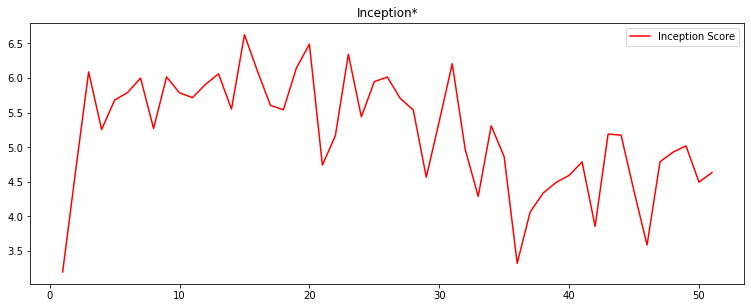

In [109]:
def plot_is_score(score):
    epochs = range(1, len(score) + 1)

    print(score)
    plt.figure(figsize=(12.8,4.8))
    plt.plot(epochs,  score, 'r', label='Inception Score')
    plt.title('Inception*')
    plt.legend()
    plt.show()
    
plot_is_score(IS_scores)

In [110]:
def load_checkpoint(file_prefix, gen_func, disc_func):
    # load up checkpoint images from previous runs ls_images_dog.npy
    ims = np.load(f'models/gan_models/{file_prefix}_images_celeb.npy')

    generator = gen_func(100) # create generator (no weights)
    discriminator = disc_func(100) # create disciminator (no weights)

    # now populate the weights from a previous training
    print(f'models/gan_models/{file_prefix}_gen.pth')
    checkpoint = torch.load(f'models/gan_models/{file_prefix}_gen_celeb.pth')
    generator.load_state_dict(checkpoint['state_dict'])

    checkpoint = torch.load(f'models/gan_models/{file_prefix}_dis_celeb.pth')
    discriminator.load_state_dict(checkpoint['state_dict'])
    
    return ims, generator, discriminator

In [111]:
if False:
    ims, generator, discriminator= load_checkpoint('ls', Generator, Discriminator)

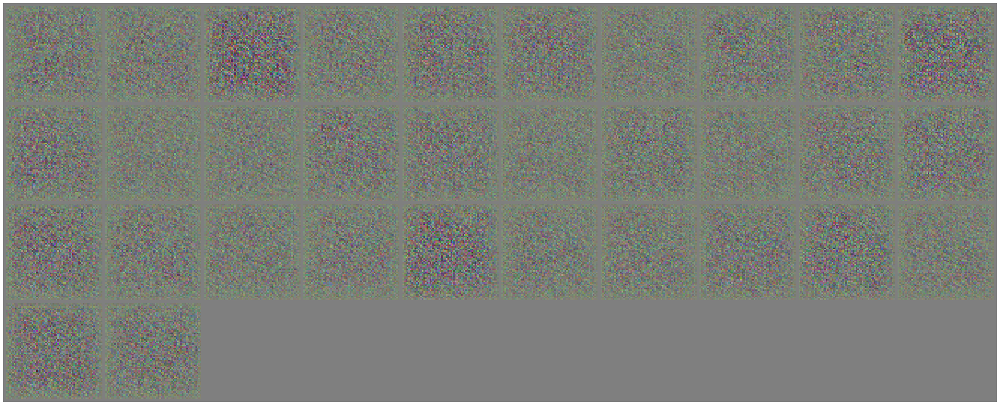

In [112]:
plt.figure(figsize=(40,40))
imshow(torchvision.utils.make_grid(generated_images, padding=2, normalize=False, nrow=10).cpu())

/tmp/ipykernel_582404/682364400.py:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  im = im.astype(np.float)


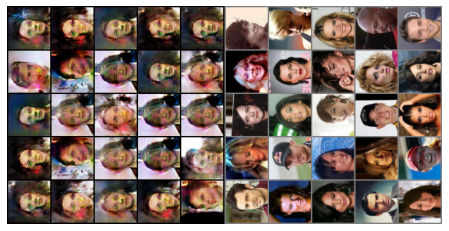

In [113]:
fig = plt.figure(figsize=(12,4))
plt.axis("off")  
pls = [[plt.imshow(norm_grid(im), animated=True)] for im in ims]
ani = animation.ArtistAnimation(fig, pls, interval=500, repeat_delay=1000, blit=True)
HTML(ani.to_jshtml())

# Use disc weight reset
The idea here is simple. Every certian number of epochs set the weights of the discriminator back some amount. This may give the generator an edge in training cause the discrinimator will "forget" things it learned about the generator.

In [114]:
log_every = 5
save_off_every = 10


# code is the exact same as above, no need to change it
# because we have changed the adversarial loss function
# Start training loop

# Becasue not much is changing, an interesting update would
# be to write a "train step" function and use it here.
# Something like: train_step(g, d, imgs, loss_select=MSE, num_d_steps=1)

def train_setback(generator, gan_optimizer,
          discriminator, discriminator_optimizer,
          iterations, dataloader, 
          setback_frequency=None,
          setback_percentage=None,
          begin_step=None):
    
    setback_amount = int(setback_percentage*setback_frequency)
    
    setback_name = f"setback_{setback_frequency}_{setback_percentage}"
    
    total_steps = 0
    if begin_step is not None:
        total_steps = begin_step

    for step in range(iterations):
        total_steps = total_steps+1
            
        # Apply setback 
        if setback_frequency is not None and setback_percentage is not None:
            # Check if we need to save off the weights
            if (total_steps+setback_amount) % setback_frequency == 0:
                torch.save({'state_dict': discriminator.state_dict()}, 'models/gan_models/setback_dis_temp.pth')
            # Check if we need to load in the weights
            if total_steps % setback_frequency == 0:
                checkpoint = torch.load('models/gan_models/setback_dis_temp.pth')
                discriminator.load_state_dict(checkpoint['state_dict'])

        for i, (imgs, classes) in enumerate(dataloader):
            #===================================
            # GENERATOR OPTIMIZE AND GET LABELS

            # Zero out any previous calculated gradients
            gan_optimizer.zero_grad()

            # Sample random points in the latent space
            random_latent_vectors = Variable(Tensor(np.random.normal(0, 1, (imgs.shape[0], latent_dim))))
            # Decode them to fake images, through the generator
            generated_images = generator(random_latent_vectors)

            # Assemble labels that say "all real images"
            # misleading target, c=1
            misleading_targets = Variable(Tensor(imgs.shape[0], 1).fill_(1.0), requires_grad=False)

            # Get MSE Loss function
            # want generator output to generate images that are "close" to all "ones" 
            g_loss = adversarial_loss(discriminator(generated_images), misleading_targets)

            # now back propagate to get derivatives
            g_loss.backward()

            # use gan optimizer to only update the parameters of the generator
            # this was setup above to only use the params of generator
            gan_optimizer.step()

            #===================================
            # DISCRIMINATOR OPTIMIZE AND GET LABELS

            # Zero out any previous calculated gradients
            discriminator_optimizer.zero_grad()

            # Combine real images with some generator images
            real_images = Variable(imgs.type(Tensor))
            combined_images = torch.cat([real_images, generated_images.detach()])
            # in the above line, we "detach" the generated images from the generator
            # this is to ensure that no needless gradients are calculated 
            # those parameters wouldn't be updated (becasue we already defined the optimized parameters)
            # but they would be calculated here, which wastes time.

            # Assemble labels discriminating real from fake images
            # real label, a=1 and fake label, b=0
            labels = torch.cat((
                Variable(Tensor(imgs.shape[0], 1).fill_(1.0), requires_grad=False),
                Variable(Tensor(imgs.shape[0], 1).fill_(0.0), requires_grad=False)
            ))
            # Add random noise to the labels - important trick!
            labels += 0.05 * torch.rand(labels.shape).to(device)

            # Setup Discriminator loss
            # this takes the average of MSE(real images labeled as real) + MSE(fake images labeled as fake)
            mid_point = combined_images.shape[0] // 2
            d_loss = (
                adversarial_loss(discriminator(combined_images[:mid_point]), labels[:mid_point]) + \
                adversarial_loss(discriminator(combined_images[mid_point:]), labels[mid_point:])
                ) / 2

            # get gradients according to loss above
            d_loss.backward()
            # optimize the discriminator parameters to better classify images
            discriminator_optimizer.step()

            # Now Clip weights of discriminator (manually)
            for p in discriminator.parameters():
                p.data.clamp_(-clip_value, clip_value)

            #===================================
        
        # Occasionally save / plot
        if step % log_every == 0:
            # Print metrics
            print('Loss at step %s: D(z_c)=%s, D(G(z_mis))=%s' % (total_steps, d_loss.item(),g_loss.item()))
            # save images in a list for display later
        
        if step % save_off_every == 0:
            
            with torch.no_grad():
                fake_output = generator(fixed_random_latent_vectors).detach().cpu()
            img_list.append(torchvision.utils.make_grid(fake_output[0:25], padding=2, normalize=True, nrow=5))
            
            IS_scores.append(inception_score(fake_output.to(device))[0])
            np.save(f'models/gan_models/{setback_name}_is_scores_celeb.npy', IS_scores)

            # in addition, save off a checkpoint of the current models and images
            ims = np.array([np.transpose(np.hstack((i,real_image_numpy)), (2,1,0)) for i in img_list])
            np.save(f'models/gan_models/{setback_name}_images_celeb.npy',ims)

            # save the state of the models (will need to recreate upon reloading)
            torch.save({'state_dict': generator.state_dict()}, f'models/gan_models/{setback_name}_gen_celeb.pth')
            torch.save({'state_dict': discriminator.state_dict()}, f'models/gan_models/{setback_name}_dis_celeb.pth')
    return (ims)

In [115]:
generator = Generator(latent_dim).to(device)
discriminator = Discriminator(latent_dim).to(device)

# LSGAN says they use ADAM, but follow up papers say RMSProp is lsightly better
#lr = 0.0002
#betas = (0.5, 0.999)

# To stabilize training, we use learning rate decay
# and gradient clipping (by value) in the optimizer.
clip_value = 1.0 # This value will use in the future training process since 
                 # PyTorch didn't has the feature to set clipvalue for 
                 # RMSprop optimizer.
        
# set discriminator learning higher than generator
discriminator_optimizer = torch.optim.RMSprop(discriminator.parameters(),
                                              lr=0.0002, weight_decay=1e-8)

gan_optimizer = torch.optim.RMSprop(generator.parameters(),
                                    lr=0.0001, weight_decay=1e-8)

# used to be: adversarial_loss = torch.nn.BCELoss() # binary cross entropy 
adversarial_loss = torch.nn.MSELoss() # mean squared error loss 

generator.apply(weights_init)
discriminator.apply(weights_init)

Discriminator(
  (model): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): BatchNorm2d(16, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (3): Conv2d(16, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): BatchNorm2d(32, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (6): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): BatchNorm2d(64, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (9): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): BatchNorm2d(128, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (12): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (13): LeakyReLU(neg

Loss at step 1: D(z_c)=0.19190719723701477, D(G(z_mis))=0.46040797233581543
Loss at step 6: D(z_c)=0.18946723639965057, D(G(z_mis))=0.25632908940315247
Loss at step 11: D(z_c)=0.17050012946128845, D(G(z_mis))=0.26506879925727844
Loss at step 16: D(z_c)=0.3740369379520416, D(G(z_mis))=0.953199565410614
Loss at step 21: D(z_c)=0.024396467953920364, D(G(z_mis))=0.7735206484794617
Loss at step 26: D(z_c)=0.037342607975006104, D(G(z_mis))=0.6473293900489807
Loss at step 31: D(z_c)=0.01226024515926838, D(G(z_mis))=0.8054326176643372
Loss at step 36: D(z_c)=0.25527873635292053, D(G(z_mis))=0.17031016945838928
Loss at step 41: D(z_c)=0.04563189670443535, D(G(z_mis))=0.6143572926521301
Loss at step 46: D(z_c)=0.012189137749373913, D(G(z_mis))=0.8533416986465454
Loss at step 51: D(z_c)=0.17836923897266388, D(G(z_mis))=0.5291653871536255
Loss at step 56: D(z_c)=0.0805855244398117, D(G(z_mis))=0.4939001500606537
Loss at step 61: D(z_c)=0.05682886019349098, D(G(z_mis))=0.6455923914909363
Loss at st

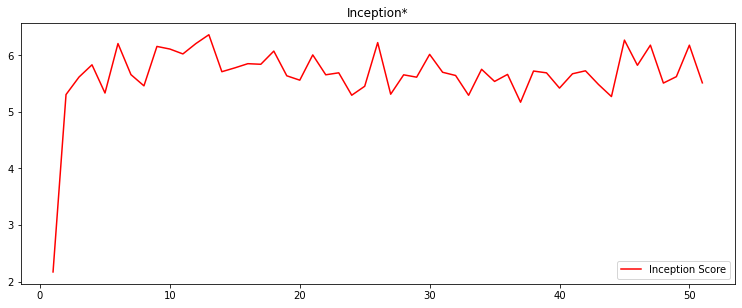

Loss at step 1: D(z_c)=0.07246788591146469, D(G(z_mis))=0.5538468956947327
Loss at step 6: D(z_c)=0.2227214127779007, D(G(z_mis))=0.2266552746295929
Loss at step 11: D(z_c)=0.21111398935317993, D(G(z_mis))=0.2790795862674713
Loss at step 16: D(z_c)=0.17727842926979065, D(G(z_mis))=0.2535271644592285
Loss at step 21: D(z_c)=0.35161587595939636, D(G(z_mis))=0.06043168902397156
Loss at step 26: D(z_c)=0.14452385902404785, D(G(z_mis))=0.9429712891578674
Loss at step 31: D(z_c)=0.005826118867844343, D(G(z_mis))=0.8659672141075134
Loss at step 36: D(z_c)=0.14416347444057465, D(G(z_mis))=0.34885820746421814
Loss at step 41: D(z_c)=0.08465983718633652, D(G(z_mis))=0.9139012098312378
Loss at step 46: D(z_c)=0.0060998969711363316, D(G(z_mis))=0.8749433159828186
Loss at step 51: D(z_c)=0.2055189609527588, D(G(z_mis))=0.6712397933006287
Loss at step 56: D(z_c)=0.16241124272346497, D(G(z_mis))=0.30635538697242737
Loss at step 61: D(z_c)=0.10936082154512405, D(G(z_mis))=0.3697046935558319
Loss at st

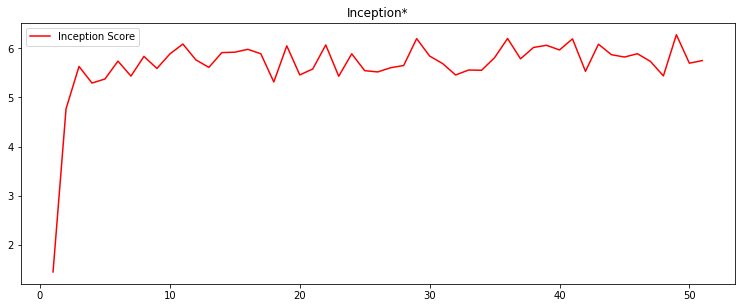

Loss at step 1: D(z_c)=0.2009018361568451, D(G(z_mis))=0.2880227267742157
Loss at step 6: D(z_c)=0.12430795282125473, D(G(z_mis))=0.6097264289855957
Loss at step 11: D(z_c)=0.14158692955970764, D(G(z_mis))=0.45273450016975403
Loss at step 16: D(z_c)=0.13682696223258972, D(G(z_mis))=0.46935325860977173
Loss at step 21: D(z_c)=0.06779336929321289, D(G(z_mis))=0.5974003672599792
Loss at step 26: D(z_c)=0.09681807458400726, D(G(z_mis))=0.537615180015564
Loss at step 31: D(z_c)=0.03758148103952408, D(G(z_mis))=0.6597383618354797
Loss at step 36: D(z_c)=0.013218718580901623, D(G(z_mis))=0.797021210193634
Loss at step 41: D(z_c)=0.004757399670779705, D(G(z_mis))=0.904110848903656
Loss at step 46: D(z_c)=0.009882680140435696, D(G(z_mis))=0.9729247093200684
Loss at step 51: D(z_c)=0.23327448964118958, D(G(z_mis))=0.3578929901123047
Loss at step 56: D(z_c)=0.20373541116714478, D(G(z_mis))=0.2427510917186737
Loss at step 61: D(z_c)=0.2157841920852661, D(G(z_mis))=0.20513270795345306
Loss at step 

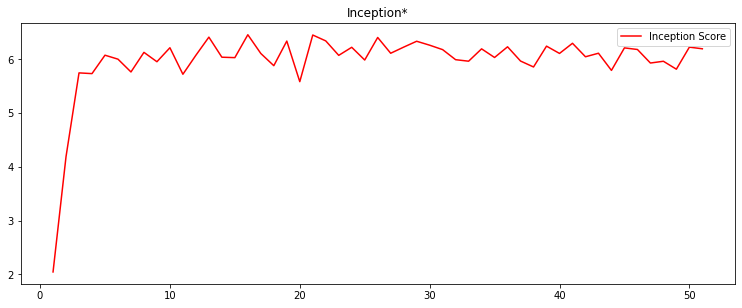

Loss at step 1: D(z_c)=0.04599158838391304, D(G(z_mis))=0.987524688243866
Loss at step 6: D(z_c)=0.21933268010616302, D(G(z_mis))=0.46516600251197815
Loss at step 11: D(z_c)=0.22855354845523834, D(G(z_mis))=0.20171669125556946
Loss at step 16: D(z_c)=0.13977602124214172, D(G(z_mis))=0.3390327990055084
Loss at step 21: D(z_c)=0.08866633474826813, D(G(z_mis))=0.4619586765766144
Loss at step 26: D(z_c)=0.22217503190040588, D(G(z_mis))=0.9152508974075317
Loss at step 31: D(z_c)=0.01783374696969986, D(G(z_mis))=0.7758550643920898
Loss at step 36: D(z_c)=0.024466997012495995, D(G(z_mis))=0.7062516212463379
Loss at step 41: D(z_c)=0.011704675853252411, D(G(z_mis))=0.8104386329650879
Loss at step 46: D(z_c)=0.0031041675247251987, D(G(z_mis))=0.8892548084259033
Loss at step 51: D(z_c)=0.01808742620050907, D(G(z_mis))=0.7903363704681396
Loss at step 56: D(z_c)=0.07180895656347275, D(G(z_mis))=0.504694938659668
Loss at step 61: D(z_c)=0.00866932887583971, D(G(z_mis))=0.8189548254013062
Loss at st

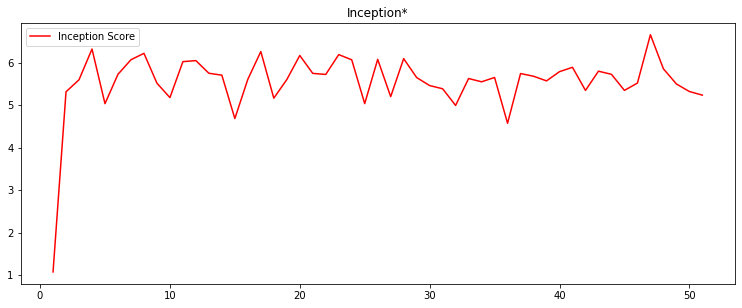

Loss at step 1: D(z_c)=0.052820589393377304, D(G(z_mis))=0.7335612177848816
Loss at step 6: D(z_c)=0.12972982227802277, D(G(z_mis))=0.4922526180744171
Loss at step 11: D(z_c)=0.1515425443649292, D(G(z_mis))=0.7449601292610168
Loss at step 16: D(z_c)=0.12884052097797394, D(G(z_mis))=0.33425119519233704
Loss at step 21: D(z_c)=0.12280268967151642, D(G(z_mis))=0.8937110900878906
Loss at step 26: D(z_c)=0.06031700223684311, D(G(z_mis))=0.6733516454696655
Loss at step 31: D(z_c)=0.04159650579094887, D(G(z_mis))=0.6506210565567017
Loss at step 36: D(z_c)=0.06356851011514664, D(G(z_mis))=0.5142308473587036
Loss at step 41: D(z_c)=0.02071280963718891, D(G(z_mis))=0.8254451751708984
Loss at step 46: D(z_c)=0.06932723522186279, D(G(z_mis))=0.5414973497390747
Loss at step 51: D(z_c)=0.020587977021932602, D(G(z_mis))=0.7932998538017273
Loss at step 56: D(z_c)=0.015967609360814095, D(G(z_mis))=0.8053173422813416
Loss at step 61: D(z_c)=0.00972171314060688, D(G(z_mis))=0.8449292182922363
Loss at ste

In [ ]:
%%time
"""
Train the Vanilla GAN. Here we use the train method above and plot each class seperately
"""
iterations = EPOCHS
experiments = [(50,0.25),
               (50,0.50),
               (50,0.75),
              (100,0.25),
              (100,0.5),
              (100,0.75),]

for setback_fequency, setback_percentage in experiments:
    global img_list
    global IS_scores
    global total_steps
    generator = Generator(latent_dim).to(device)
    discriminator = Discriminator(latent_dim).to(device)

    # To stabilize training, we use learning rate decay
    # and gradient clipping (by value) in the optimizer.
    clip_value = 1.0 # This value will use in the future training process since 
                     # PyTorch didn't has the feature to set clipvalue for 
                     # RMSprop optimizer.

    # set discriminator learning higher than generator
    discriminator_optimizer = torch.optim.RMSprop(discriminator.parameters(),
                                                  lr=0.0002, weight_decay=1e-8)

    gan_optimizer = torch.optim.RMSprop(generator.parameters(),
                                        lr=0.0001, weight_decay=1e-8)

    # used to be: adversarial_loss = torch.nn.BCELoss() # binary cross entropy 
    adversarial_loss = torch.nn.MSELoss() # mean squared error loss 

    generator.apply(weights_init)
    discriminator.apply(weights_init)

    # Sample random points in the latent space
    plot_num_examples = 200
    fixed_random_latent_vectors = torch.randn(plot_num_examples, latent_dim, device=device)
    img_list= []
    IS_scores = []
    total_steps = 0

    real_image_numpy = np.transpose(
        torchvision.utils.make_grid(real_image_examples[:25,:,:,:],
                                    padding=2, normalize=False, nrow=5),(0,1,2))

    # every 3 epochs set back 2
    ims = train_setback(generator=generator, gan_optimizer=gan_optimizer,
                        discriminator=discriminator, discriminator_optimizer=discriminator_optimizer,
                        iterations=iterations, dataloader=dataloader,
                        setback_frequency=setback_fequency,setback_percentage=setback_percentage
                             )

    plot_is_score(IS_scores)

In [ ]:
def load_checkpoint(file_prefix, gen_func, disc_func):
    # load up checkpoint images from previous runs ls_images_dog.npy
    ims = np.load(f'models/gan_models/{file_prefix}_images_celeb.npy')

    generator = gen_func(100) # create generator (no weights)
    discriminator = disc_func(100) # create disciminator (no weights)

    # now populate the weights from a previous training
    print(f'models/gan_models/{file_prefix}_gen.pth')
    checkpoint = torch.load(f'models/gan_models/{file_prefix}_gen_celeb.pth')
    generator.load_state_dict(checkpoint['state_dict'])

    checkpoint = torch.load(f'models/gan_models/{file_prefix}_dis_celeb.pth')
    discriminator.load_state_dict(checkpoint['state_dict'])
    
    return ims, generator, discriminator

In [ ]:
ims, generator_set_back, discriminator_set_back = \
    load_checkpoint('setback_3_0.7', Generator, Discriminator)
ims, generator, discriminator = \
    load_checkpoint('ls', Generator, Discriminator)
generator_set_back = generator_set_back.cpu()
discriminator_set_back = generator_set_back.cpu()
generator = generator.cpu()
discriminator = discriminator.cpu()

In [ ]:
### Plot a lot of generated images

# Sample random points in the latent space
random_latent_vectors = Variable(Tensor(np.random.normal(0, 1, (100, latent_dim)))).to('cpu')
random_latent_vectors_long = Variable(Tensor(np.random.normal(0, 1, (5000, latent_dim)))).to('cpu')

# Decode them to fake images, through the generator
generated_images_setback = generator_set_back(random_latent_vectors).to('cpu')
generated_images_setback_long = generator_set_back(random_latent_vectors_long).to('cpu')
plt.figure(figsize=(40,40))
imshow(torchvision.utils.make_grid(generated_images_setback, padding=2, normalize=False, nrow=10).cpu())

# Plot a lot of generated images

# Decode them to fake images, through the generator
generated_images_vanilla = generator(random_latent_vectors).to('cpu')
generated_images_vanilla_long = generator(random_latent_vectors_long).to('cpu')
plt.figure(figsize=(40,40))
imshow(torchvision.utils.make_grid(generated_images_vanilla, padding=2, normalize=False, nrow=10).cpu())

In [ ]:
print(inception_score(generated_images_setback, cuda=False, batch_size=32, resize=True, splits=1))
print(inception_score(generated_images_vanilla, cuda=False, batch_size=32, resize=True, splits=1))

In [ ]:
%%time
print(inception_score(generated_images_setback_long, cuda=False, batch_size=32, resize=True, splits=1))
print(inception_score(generated_images_vanilla_long, cuda=False, batch_size=32, resize=True, splits=1))